In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 
import seaborn as sns
from sklearn.experimental import (
    enable_iterative_imputer,
)
from sklearn import (
    ensemble,
    impute,
    model_selection,    
    preprocessing,
    tree,
)
from sklearn.ensemble import (
    RandomForestClassifier,
)
from yellowbrick.model_selection import (
    ValidationCurve,
)

url = (
    "http://biostat.mc.vanderbilt.edu/"
    "wiki/pub/Main/DataSets/titanic3.xls"
)
df = pd.read_excel(url)
def tweak_titanic(df):
    df = df.drop(
        columns=[
            "name",
            "ticket",
            "home.dest",
            "boat",
            "body",
            "cabin",
        ]
    ).pipe(pd.get_dummies, drop_first=True)
    return df

def get_train_test_X_y(
    df, y_col, size=0.3, std_cols=None
):
    y = df[y_col]
    X = df.drop(columns=y_col)
    X_train, X_test, y_train, y_test = model_selection.train_test_split(
        X, y, test_size=size, random_state=42
    )
    cols = X.columns
    num_cols = [
        "pclass",
        "age",
        "sibsp",
        "parch",
        "fare",
    ]
    fi = impute.IterativeImputer()

    fitted = fi.fit_transform(X_train[num_cols])
    X_train = X_train.assign(**{c:fitted[:,i] for i, c in enumerate(num_cols)})
    test_fit = fi.transform(X_test[num_cols])
    X_test = X_test.assign(**{c:test_fit[:,i] for i, c in enumerate(num_cols)})
    if std_cols:
        std = preprocessing.StandardScaler()
        fitted = std.fit_transform(X_train[std_cols])
        X_train = X_train.assign(**{c:fitted[:,i] for i, c in enumerate(std_cols)})
        test_fit = std.transform(X_test[std_cols])
        X_test = X_test.assign(**{c:test_fit[:,i] for i, c in enumerate(std_cols)})

    return X_train, X_test, y_train, y_test

ti_df = tweak_titanic(df)
std_cols = "pclass,age,sibsp,fare".split(",")
X_train, X_test, y_train, y_test = get_train_test_X_y(
    ti_df, "survived", std_cols=std_cols
)


X = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

In [2]:
ti_df = tweak_titanic(df)
std_cols = "pclass,age,sibsp,fare".split(",")
X_train, X_test, y_train, y_test = get_train_test_X_y(
    ti_df, "survived", std_cols=std_cols
)
X = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

In [3]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import (
    StandardScaler,
)
pca = PCA(random_state=42)
X_pca = pca.fit_transform(
    StandardScaler().fit_transform(X)
)
pca.explained_variance_ratio_
pca.components_[0]

array([-0.63274156,  0.39602149,  0.00653646,  0.11500362,  0.5815031 ,
       -0.19764926, -0.20422289, -0.10304598])

[(0, 1),
 Text(0, 0.5, 'Odsetek wyjaśnionej wariancji'),
 Text(0.5, 0, 'Główne składowe'),
 Text(0.5, 1.0, 'Wykres osypiska')]

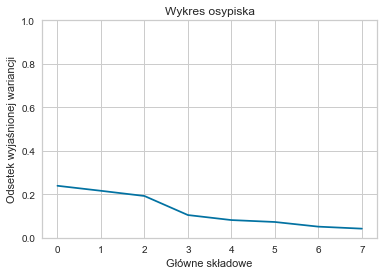

In [4]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(pca.explained_variance_ratio_)
ax.set(
    xlabel="Główne składowe",
    ylabel="Odsetek wyjaśnionej wariancji",
    title="Wykres osypiska",
    ylim=(0, 1),
)
# fig.savefig(
#     "images/mlpr_1701.png",
#     dpi=300,
#     bbox_inches="tight",
# )

[(0, 1),
 Text(0, 0.5, 'Odsetek wyjaśnionej wariancji'),
 Text(0.5, 0, 'Główne składowe'),
 Text(0.5, 1.0, 'Skumulowana wariancja')]

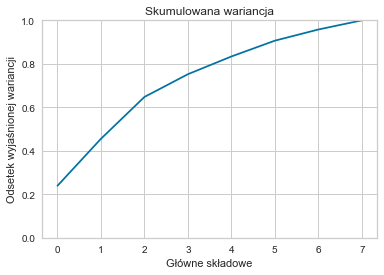

In [5]:
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(
    np.cumsum(pca.explained_variance_ratio_)
)
ax.set(
    xlabel="Główne składowe",
    ylabel="Odsetek wyjaśnionej wariancji",
    title="Skumulowana wariancja",
    ylim=(0, 1),
)
# fig.savefig("images/mlpr_1702.png", dpi=300)

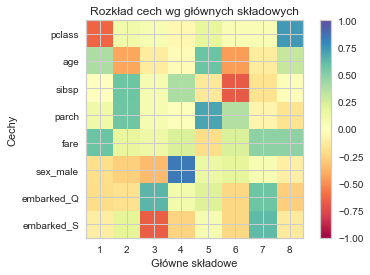

In [6]:
fig, ax = plt.subplots(figsize=(6, 4))
plt.imshow(
    pca.components_.T,
    cmap="Spectral",
    vmin=-1,
    vmax=1,
)
plt.yticks(range(len(X.columns)), X.columns)
plt.xticks(range(8), range(1, 9))
plt.xlabel("Główne składowe")
plt.ylabel("Cechy")
plt.title("Rozkład cech wg głównych składowych")
plt.colorbar()
# fig.savefig("images/mlpr_1703.png", dpi=300)

[Text(0, 0.5, 'Udział cechy'),
 Text(0.5, 0, 'Główne składowe'),
 Text(0.5, 1.0, 'Rozkład cech wg głównych składowych')]

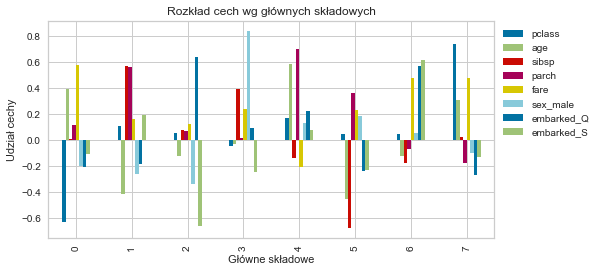

In [7]:
fig, ax = plt.subplots(figsize=(8, 4))
pd.DataFrame(
    pca.components_, columns=X.columns
).plot(kind="bar", ax=ax).legend(
    bbox_to_anchor=(1, 1)
)
ax.set(
    xlabel="Główne składowe",
    ylabel="Udział cechy",
    title="Rozkład cech wg głównych składowych"
)
# fig.savefig("images/mlpr_1704.png", dpi=300)

In [8]:
comps = pd.DataFrame(
    pca.components_, columns=X.columns
)
min_val = 0.5
num_components = 2
pca_cols = set()
for i in range(num_components):
    parts = comps.iloc[i][
        comps.iloc[i].abs() > min_val
    ]
    pca_cols.update(set(parts.index))
pca_cols

{'fare', 'parch', 'pclass', 'sibsp'}

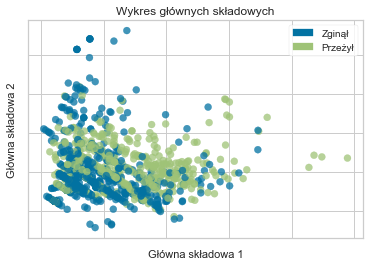

In [9]:
from yellowbrick.features.pca import PCADecomposition
from yellowbrick.draw import manual_legend
fig, ax = plt.subplots(figsize=(6, 4))
colors = ["rg"[j] for j in y]
pca_viz = PCADecomposition(color=colors)
pca_viz.fit_transform(X, y)
ax.set(
    xlabel="Główna składowa 1",
    ylabel="Główna składowa 2",
    title="Wykres głównych składowych"
)
ax.set_xticklabels([])
ax.set_yticklabels([])
manual_legend(pca_viz, ("Zginął", "Przeżył"), list(pca_viz._colors.values()), frameon=True)
# fig.savefig("images/mlpr_1705.png", dpi=300)

[Text(0.5, 1.0, 'Wykres głównych składowych')]

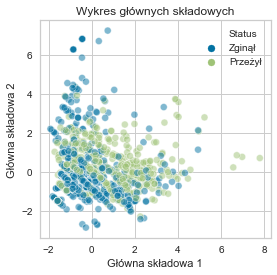

In [10]:
fig, ax = plt.subplots(figsize=(6, 4))
pca_df = pd.DataFrame(
    X_pca,
    columns=[
        f"Główna składowa {i+1}"
        for i in range(X_pca.shape[1])
    ],
)
pca_df["Status"] = [
    ("Zginął", "Przeżył")[i] for i in y
]
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[1] / evr[0])
sns.scatterplot(
    x="Główna składowa 1",
    y="Główna składowa 2",
    hue="Status",
    data=pca_df,
    alpha=0.5,
    ax=ax,
)
ax.set(title="Wykres głównych składowych")
# fig.savefig(
#     "images/mlpr_1706.png",
#     dpi=300,
#     bbox_inches="tight",
# )

[Text(0.5, 1.0, 'Wykres głównych składowych')]

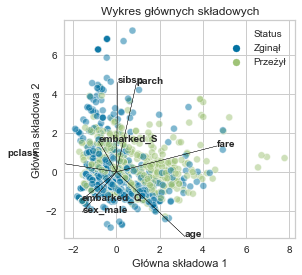

In [11]:
fig, ax = plt.subplots(figsize=(6, 4))
pca_df = pd.DataFrame(
    X_pca,
    columns=[
        f"Główna składowa {i+1}"
        for i in range(X_pca.shape[1])
    ],
)
pca_df["Status"] = [
    ("Zginął", "Przeżył")[i] for i in y
]
evr = pca.explained_variance_ratio_
x_idx = 0  # x_pc
y_idx = 1  # y_pc
ax.set_aspect(evr[y_idx] / evr[x_idx])
x_col = pca_df.columns[x_idx]
y_col = pca_df.columns[y_idx]
sns.scatterplot(
    x=x_col,
    y=y_col,
    hue="Status",
    data=pca_df,
    alpha=0.5,
    ax=ax,
)
scale = 8
comps = pd.DataFrame(
    pca.components_, columns=X.columns
)
for idx, s in comps.T.iterrows():
    plt.arrow(
        0,
        0,
        s[x_idx] * scale,
        s[y_idx] * scale,
        color="k",
    )
    plt.text(
        s[x_idx] * scale,
        s[y_idx] * scale,
        idx,
        weight="bold",
    )
ax.set(title="Wykres głównych składowych")
# fig.savefig(
#     "images/mlpr_1707.png",
#     dpi=300,
#     bbox_inches="tight",
# )

[Text(0.5, 1.0, 'Wykres głównych składowych')]

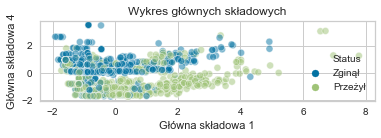

In [12]:
fig, ax = plt.subplots(figsize=(6, 4))
pca_df = pd.DataFrame(
    X_pca,
    columns=[
        f"Główna składowa {i+1}"
        for i in range(X_pca.shape[1])
    ],
)
pca_df["Status"] = [
    ("Zginął", "Przeżył")[i] for i in y
]
evr = pca.explained_variance_ratio_
ax.set_aspect(evr[3] / evr[0])
sns.scatterplot(
    x="Główna składowa 1",
    y="Główna składowa 4",
    hue="Status",
    data=pca_df,
    alpha=0.5,
    ax=ax,
)
ax.set(title="Wykres głównych składowych")
# fig.savefig(
#     "images/mlpr_1708.png",
#     dpi=300,
#     bbox_inches="tight",
# )

In [13]:
from bokeh.io import output_notebook
from bokeh import models, palettes, transform
from bokeh.plotting import figure, show
def bokeh_scatter(
    x,
    y,
    data,
    hue=None,
    label_cols=None,
    size=None,
    legend=None,
    alpha=0.5,
):
    """
    x – nazwa kolumny dla osi x
    y - nazwa kolumny dla osi y
    data – struktura danych DataFrame
    hue – nazwa kolumny kolorów (liczby)
    legend – nazwwa kolumny dla legendy
    label_cols – kolumny wykorzystywane w dymkach
                 (None – nazwy w DataFrame)
    size – wielkość punktów
    alpha - przezroczystość
    """
    output_notebook()
    circle_kwargs = {}
    if legend:
        circle_kwargs["legend"] = legend
    if size:
        circle_kwargs["size"] = size
    if hue:
        color_seq = data[hue]
        mapper = models.LinearColorMapper(
            palette=palettes.viridis(256),
            low=min(color_seq),
            high=max(color_seq),
        )
        circle_kwargs[
            "fill_color"
        ] = transform.transform(hue, mapper)
    ds = models.ColumnDataSource(data)
    if label_cols is None:
        label_cols = data.columns
    tool_tips = sorted(
        [
            (x, "@{}".format(x))
            for x in label_cols
        ],
        key=lambda tup: tup[0],
    )
    hover = models.HoverTool(
        tooltips=tool_tips
    )
    fig = figure(
        tools=[
            hover,
            "pan",
            "zoom_in",
            "zoom_out",
            "reset",
        ],
        toolbar_location="below",
        title="Wykres głównych składowych"
    )
    fig.xaxis.axis_label = "Główna składowa {}".format(x)
    fig.yaxis.axis_label = "Główna składowa {}".format(y)
    fig.circle(
        x,
        y,
        source=ds,
        alpha=alpha,
        **circle_kwargs
    )
    show(fig)
    return fig

pca_df = pd.DataFrame(
    X_pca,
    columns=[
        f"{i+1}"
        for i in range(X_pca.shape[1])
    ],
)
pca_df["Status"] = [
    ("Zginął", "Przeżył")[i] for i in y
]

res = bokeh_scatter(
    "1",
    "2",
    pca_df.assign(status=y.reset_index(drop=True)),
    hue="status",
    size=10,
    legend="Status",
)

Loading BokehJS ...

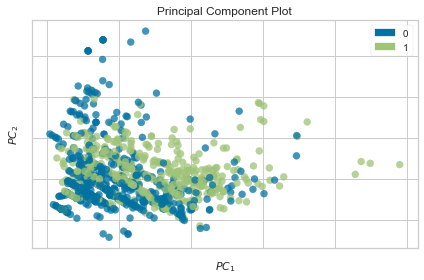

In [14]:
from yellowbrick.features.pca import (
    PCADecomposition,
)
colors = ["rg"[j] for j in y]
pca3_viz = PCADecomposition(
    proj_dim=3, color=colors
)
pca3_viz.fit_transform(X, y)
pca3_viz.finalize()
fig = plt.gcf()
plt.tight_layout()
# fig.savefig(
#     "images/mlpr_1710.png",
#     dpi=300,
#     bbox_inches="tight",
# )

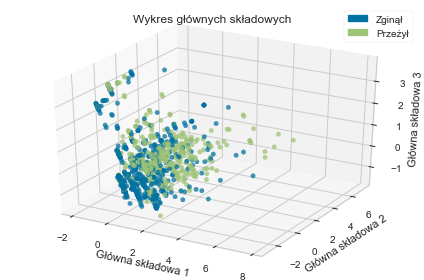

In [15]:
from yellowbrick.features.pca import (
    PCADecomposition,
)
colors = ["rg"[j] for j in y]
pca3_viz = PCADecomposition(
    projection=3, color=colors,
)
pca3_viz.fit_transform(X, y)
pca3_viz.ax.set_title("Wykres głównych składowych")
pca3_viz.ax.set_xlabel("Główna składowa 1")
pca3_viz.ax.set_ylabel("Główna składowa 2")
pca3_viz.ax.set_zlabel("Główna składowa 3")
manual_legend(pca3_viz, ("Zginął", "Przeżył"), list(pca3_viz._colors.values()), frameon=True)
fig = plt.gcf()
plt.tight_layout()
# fig.savefig(
#     "images/mlpr_1710.png",
#     dpi=300,
#     bbox_inches="tight",
# )

In [16]:
import scprep
scprep.plot.rotate_scatter3d(
    X_pca[:, :3],
    c=pca_df["Status"],
    cmap="Spectral",
    figsize=(8, 6),
    label_prefix="Główna składowa ",
    title="Wykres głównych składowych",
    fontsize=12,
)

[Text(0.5, 0, 'Główna składowa 3'),
 Text(0.5, 0, 'Główna składowa 2'),
 Text(0.5, 0, 'Główna składowa 1'),
 Text(0.5, 0.92, 'Wykres głównych składowych')]

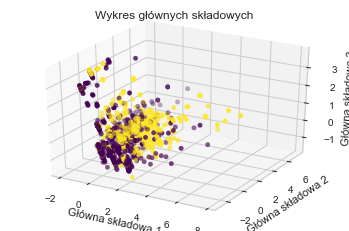

In [17]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(
    xs=X_pca[:, 0],
    ys=X_pca[:, 1],
    zs=X_pca[:, 2],
    c=y,
    cmap='viridis',
)
ax.set(title="Wykres głównych składowych", xlabel="Główna składowa 1", ylabel="Główna składowa 2", zlabel="Główna składowa 3")

In [18]:
import umap
u = umap.UMAP(random_state=42)
X_umap = u.fit_transform(
    StandardScaler().fit_transform(X)
)
X_umap.shape

c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


(1309, 2)

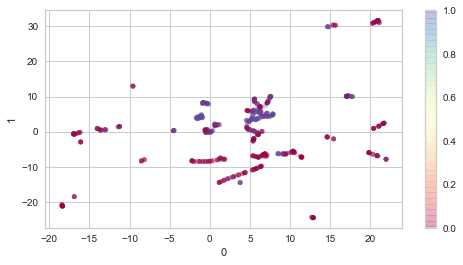

In [19]:
fig, ax = plt.subplots(figsize=(8, 4))
pd.DataFrame(X_umap).plot(
    kind="scatter",
    x=0,
    y=1,
    ax=ax,
    c=y,
    alpha=0.2,
    cmap="Spectral",
)
# fig.savefig("images/mlpr_1713.png", dpi=300)

c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 365 separate connected components using meta-embedding (experimental)
  n_components
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:182: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 28 separate connected components using meta-embedding (experimental)
  n_components
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 5 separate connected components using meta-embedding (experime

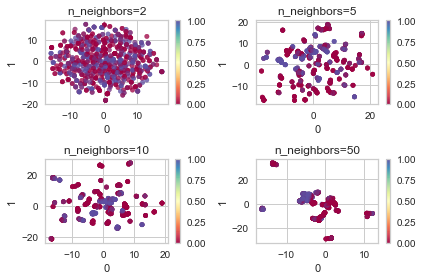

In [20]:
X_std = StandardScaler().fit_transform(X)
fig, axes = plt.subplots(2, 2, figsize=(6, 4))
axes = axes.reshape(4)
for i, n in enumerate([2, 5, 10, 50]):
    ax = axes[i]
    u = umap.UMAP(
        random_state=42, n_neighbors=n
    )
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5,
    )
    ax.set_title(f"n_neighbors={n}")
plt.tight_layout()
# fig.savefig("images/mlpr_1714.png", dpi=300)

c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


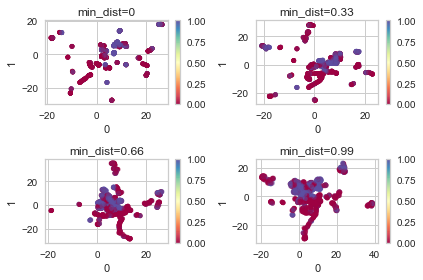

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(6, 4))
axes = axes.reshape(4)
for i, n in enumerate([0, 0.33, 0.66, 0.99]):
    ax = axes[i]
    u = umap.UMAP(random_state=42, min_dist=n)
    X_umap = u.fit_transform(X_std)
    pd.DataFrame(X_umap).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5,
    )
    ax.set_title(f"min_dist={n}")
plt.tight_layout()
# fig.savefig("images/mlpr_1715.png", dpi=300)

In [22]:
from sklearn.manifold import TSNE
X_std = StandardScaler().fit_transform(X)
ts = TSNE()
X_tsne = ts.fit_transform(X_std)

Text(0, 0.5, 'Osadzenie 2')

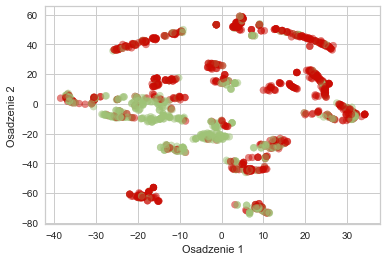

In [23]:
fig, ax = plt.subplots(figsize=(6, 4))
colors = ["rg"[j] for j in y]
scat = ax.scatter(
    X_tsne[:, 0],
    X_tsne[:, 1],
    c=colors,
    alpha=0.5,
)
ax.set_xlabel("Osadzenie 1")
ax.set_ylabel("Osadzenie 2")
# fig.savefig("images/mlpr_1716.png", dpi=300)

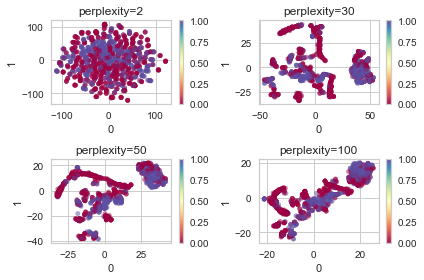

In [24]:
fig, axes = plt.subplots(2, 2, figsize=(6, 4))
axes = axes.reshape(4)
for i, n in enumerate((2, 30, 50, 100)):
    ax = axes[i]
    t = TSNE(random_state=42, perplexity=n)
    X_tsne = t.fit_transform(X)
    pd.DataFrame(X_tsne).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5,
    )
    ax.set_title(f"perplexity={n}")
plt.tight_layout()
# fig.savefig("images/mlpr_1717.png", dpi=300)

In [25]:
import phate
p = phate.PHATE(random_state=42)
X_phate = p.fit_transform(X)
X_phate.shape

Calculating PHATE...
  Running PHATE on 1309 cells and 8 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 0.14 seconds.
  Calculating optimal t...


c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:291: RuntimeWarning: Detected zero distance between 1616 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:449: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


  Calculated optimal t in 1.98 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.59 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.31 seconds.
Calculated PHATE in 6.05 seconds.


(1309, 2)

c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.
  


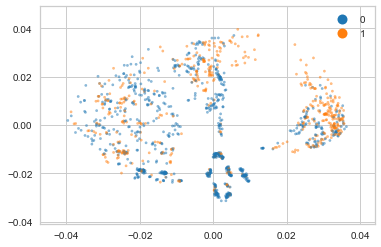

In [26]:
fig, ax = plt.subplots(figsize=(6, 4))
phate.plot.scatter2d(p, c=y, ax=ax, alpha=0.5)
# fig.savefig("images/mlpr_1718.png", dpi=300)

Calculating PHATE...
  Running PHATE on 1309 cells and 8 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.16 seconds.
  Calculating optimal t...


c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:291: RuntimeWarning: Detected zero distance between 1616 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:449: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


  Calculated optimal t in 2.20 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.61 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.41 seconds.
Calculated PHATE in 6.38 seconds.
Calculating PHATE...
  Running PHATE on 1309 cells and 8 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 0.17 seconds.
  Calculating optimal t...


c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:291: RuntimeWarning: Detected zero distance between 1616 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:449: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))


  Calculated optimal t in 2.28 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.73 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.39 seconds.
Calculated PHATE in 6.58 seconds.
Calculating PHATE...
  Running PHATE on 1309 cells and 8 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.11 seconds.
  Calculated graph and diffusion operator in 0.23 seconds.
  Calculating optimal t...


c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:291: RuntimeWarning: Detected zero distance between 1616 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


  Calculated optimal t in 1.97 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.69 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.30 seconds.
Calculated PHATE in 6.23 seconds.
Calculating PHATE...
  Running PHATE on 1309 cells and 8 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.30 seconds.
    Calculating affinities...


c:\users\admin\appdata\local\programs\python\python36\lib\site-packages\graphtools\graphs.py:291: RuntimeWarning: Detected zero distance between 1616 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 0.31 seconds.
  Calculated graph and diffusion operator in 0.66 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.95 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.83 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.39 seconds.
Calculated PHATE in 6.86 seconds.


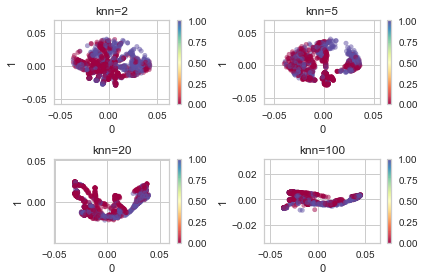

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(6, 4))
axes = axes.reshape(4)
p = phate.PHATE(random_state=42, n_jobs=-1)
for i, n in enumerate((2, 5, 20, 100)):
    ax = axes[i]
    p.set_params(knn=n)
    X_phate = p.fit_transform(X)
    pd.DataFrame(X_phate).plot(
        kind="scatter",
        x=0,
        y=1,
        ax=ax,
        c=y,
        cmap="Spectral",
        alpha=0.5,
    )
    ax.set_title(f"knn={n}")
plt.tight_layout()
fig.savefig("images/mlpr_1719.png", dpi=300)